# 3.1 Clustering


## 3.1.1 K-means clustering 


Clustering is an unsupervised problem because the goal is to discover structure on the basis of data sets. Clustering looks to find homogeneous subgroups among the observations. 

K-means is an unsupervised clustering method. The main idea is to separate the data points into K dinstinct clusters. We then have two problems to solve. First, we need to find the k centroids of the k clusters. Then, we need to affect each data point to the cluster which centroid is the closest to the data point.

The algorithm is the following:

* Choose the number k of clusters
* Initialize the clusters and calculate the feature mean as initial the clusters centroid
* Iterate until convergence (e.g. cluster assignemnt stops changing):
  - Assign each data point to its corresponding cluster ID
  - Compute the value of the objective function (sum ove the clusters of the distances between the points and the cluster centroids)
  - Update the centers of the clusters
The solution will converge to a local minimum. Consequently, the result depends on the initial stage. It is prudent to perform the algorithm several times with different initial configurations.
  
The results depends on the initial step because only local min

Import useful Python packages

In [100]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import random
import wget
from math import cos, sin, pi, sqrt
from mpl_toolkits.mplot3d import Axes3D
from sklearn import preprocessing
from sklearn.decomposition import PCA
import plotly.express as px

### Flow cytometer data is organized by files. 
The file has attributes about each particle, such as normalized scatter, red, orange, and green. These are measurements from the instrument iteself from light scattering.
Other parameters, like diam (diameter) and Qc (carbon quota) are estimated from the light scatter measurements.

In [101]:
# download data
cc=wget.download("https://www.dropbox.com/s/dwa82x6xhjkhyw8/ug3_FCM_distribution.feather?dl=1")

Read the data

In [102]:
# this is some underway data collected from a cruise in 2019

underway_g3 = pd.read_feather("ug3_FCM_distribution.feather")
print(underway_g3.columns)
underway_g3.head()

Index(['filename', 'pop', 'norm.scatter', 'norm.red', 'norm.orange',
       'norm.green', 'diam_lwr', 'Qc_lwr', 'diam_mid', 'Qc_mid', 'diam_upr',
       'Qc_upr', 'date', 'file', 'label', 'lat', 'lon', 'depth', 'replicate',
       'volume', 'stain', 'flag', 'comments'],
      dtype='object')


,filename,pop,norm.scatter,norm.red,norm.orange,norm.green,diam_lwr,Qc_lwr,diam_mid,Qc_mid,...,file,label,lat,lon,depth,replicate,volume,stain,flag,comments
0,towfish_001.fcs,prochloro,0.009565,0.008967,0.001417,0.003938,0.540813,0.030637,0.653386,0.049902,...,towfish_001,T20.28.05,30.0935,-158.0003,5,A,173,0,2,pro peak near low fluor noise
1,towfish_001.fcs,prochloro,0.008924,0.015568,0.001417,0.003938,0.532844,0.029486,0.643588,0.047994,...,towfish_001,T20.28.05,30.0935,-158.0003,5,A,173,0,2,pro peak near low fluor noise
2,towfish_001.fcs,prochloro,0.005311,0.011982,0.001417,0.003938,0.478654,0.022358,0.577122,0.036229,...,towfish_001,T20.28.05,30.0935,-158.0003,5,A,173,0,2,pro peak near low fluor noise
3,towfish_001.fcs,picoeuk,0.925120,1.580796,0.003468,0.003938,1.548094,0.462018,2.003069,0.898166,...,towfish_001,T20.28.05,30.0935,-158.0003,5,A,173,0,2,pro peak near low fluor noise
4,towfish_001.fcs,picoeuk,0.277725,0.207073,0.001417,0.003938,1.136778,0.208269,1.416857,0.367623,...,towfish_001,T20.28.05,30.0935,-158.0003,5,A,173,0,2,pro peak near low fluor noise


In [103]:
files = list(pd.unique(underway_g3['filename']))
print(files)

['towfish_001.fcs', 'towfish_002.fcs', 'towfish_003.fcs', 'towfish_004.fcs', 'towfish_005.fcs', 'towfish_006.fcs', 'towfish_007.fcs', 'towfish_008.fcs', 'towfish_009.fcs', 'towfish_010.fcs', 'towfish_011.fcs', 'towfish_012.fcs', 'towfish_013.fcs', 'towfish_014.fcs', 'towfish_015.fcs', 'towfish_016.fcs', 'towfish_017.fcs', 'towfish_018.fcs', 'towfish_019.fcs', 'towfish_020.fcs', 'underway_002.fcs', 'underway_003.fcs', 'underway_004.fcs', 'underway_005.fcs', 'underway_006.fcs', 'underway_007.fcs', 'underway_008.fcs', 'underway_009.fcs', 'underway_010.fcs', 'underway_011.fcs', 'underway_012.fcs', 'underway_013.fcs', 'underway_014.fcs', 'underway_015.fcs', 'underway_017.fcs', 'underway_018.fcs', 'underway_019.fcs', 'underway_020.fcs', 'underway_021.fcs', 'underway_022.fcs', 'underway_023.fcs', 'underway_024.fcs', 'underway_025.fcs', 'underway_026.fcs', 'underway_027.fcs', 'underway_028.fcs', 'underway_029.fcs', 'underway_030.fcs', 'underway_031.fcs', 'underway_032.fcs', 'underway_033.fcs',

Each file is 1 sample taken at a certain time, location, and depth. There are also replicates, or even triplicates, run on the same spatiotemporal scale to get uncertainty estimations on the instrument. We can either ignore the replicates/triplicates or take the mean. 

In [104]:
test1 = underway_g3[underway_g3['filename']==files[100]]

In [105]:

px.scatter(test1, 'norm.scatter', 'norm.red', color='pop',log_x=True, log_y=True)


In [106]:
px.scatter(test1, 'norm.scatter','norm.orange',color='pop',log_x=True,log_y=True)

Typically, populations are gated based on their log-transformed normalized scatter (x) and red (y). Orange flouresence can be used in addition to gate the synecho population. We can see there are 3 populations here, and these were previously gated from the parameters above. 

/var/folders/j4/3rbzxjb16kv66g_p4wkzq16h0000gn/T/ipykernel_80629/1250319153.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/j4/3rbzxjb16kv66g_p4wkzq16h0000gn/T/ipykernel_80629/1250319153.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/j4/3rbzxjb16kv66g_p4wkzq16h0000gn/T/ipykernel_80629/1250319153.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

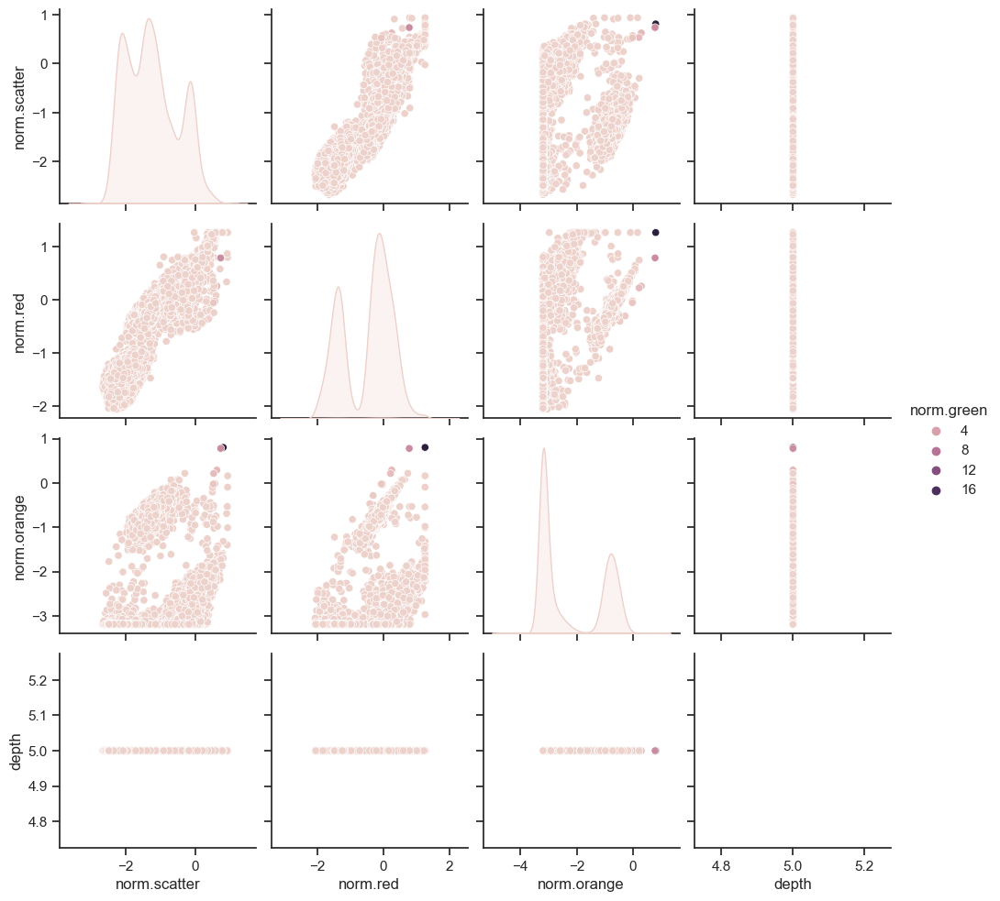

In [107]:
import seaborn as sns
sns.set_theme(style="ticks")
df = test1[['norm.scatter','norm.red','norm.orange','norm.green','depth']]
df.loc[:,'norm.scatter'] = np.log10(df['norm.scatter'])
df.loc[:,'norm.red'] = np.log10(df['norm.red'])
df.loc[:,'norm.orange'] = np.log10(df['norm.orange'])
sns.pairplot(df, hue="norm.green")

/var/folders/j4/3rbzxjb16kv66g_p4wkzq16h0000gn/T/ipykernel_80629/3931145617.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/j4/3rbzxjb16kv66g_p4wkzq16h0000gn/T/ipykernel_80629/3931145617.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/j4/3rbzxjb16kv66g_p4wkzq16h0000gn/T/ipykernel_80629/3931145617.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

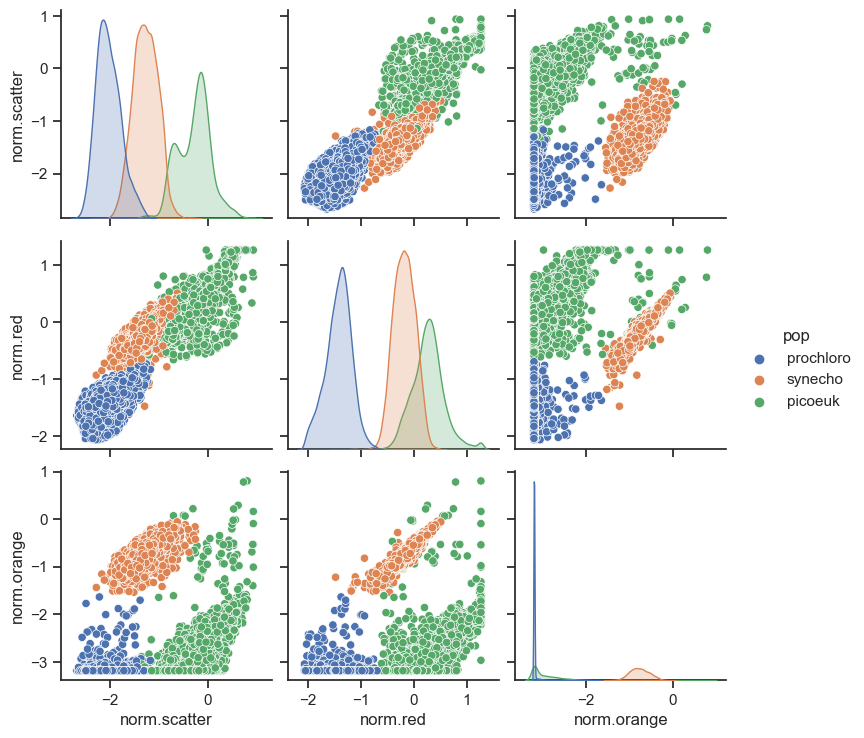

In [108]:
sns.set_theme(style="ticks")
df = test1[['norm.scatter','norm.red','norm.orange','pop']]
df['norm.scatter'] = np.log10(df['norm.scatter'])
df['norm.red'] = np.log10(df['norm.red'])
df['norm.orange'] = np.log10(df['norm.orange'])
sns.pairplot(df, hue="pop")

**K-means clustering**

The goal is to partition $n$ data points into $k$ clusters. Each observation is labeled to a cluster with the nearest mean.

K-means is iterative:
1. assume initial values for the mean of each of the $k$ clusters
2. Compute the distance for each observation to each of the $k$ means
3. Label each observation as belonging to the nearest means
4. Find the *center of mass* (mean) of each group of labeled points. These are new means to step 1.


In the following, we denote $n$ the number of data points, and $p$ the number of features for each data point.

In [109]:
n = len(df)
p = 3 #()
print('We have {:d} data points, and each one has {:d} features'.format(n, p))

We have 21988 data points, and each one has 3 features


Let's define a numpy array with the 3 features and all of the data

In [110]:
data = np.zeros(shape=(n,p))
data[:,0] = df['norm.scatter']
data[:,1] = df['norm.red']
data[:,2] = df['norm.orange']

Let us define a function to initialize the centroid of the clusters. We choose random points within the range of values taken by the data.

In [111]:
def init_centers(data, k):
    """
    """
    # Initialize centroids
    centers = np.zeros((k, np.shape(data)[1]))
    # Loop on k centers
    for i in range(0, k):
        # Generate p random values between 0 and 1
        dist = np.random.uniform(size=np.shape(data)[1])
        # Use the random values to generate a point within the range of values taken by the data
        centers[i, :] = np.min(data, axis=0) + (np.max(data, axis=0) - np.min(data, axis=0)) * dist
    return centers

To be able to affect each data point to the closest centroid, we need to define the distance between two data points. The most common distance is the **Euclidean distance**:

$d(x,y) = \sqrt{\sum_{i = 1}^p (x_i - y_i)^2}$

where $x$ and $y$ are two data observation points with $p$ variables. There exist many other distance metrics, which can be called from the ``DistanceMetric`` sci-kit learn module. You can find a review here: https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.DistanceMetric.html

We then define a function to compute the distance between each data point and each centroid.

In [112]:
def compute_distance(data, centers, k):
    """
    """
    # Initialize distance
    distance = np.zeros((np.shape(data)[0], k))
    # Loop on n data points
    for i in range(0, np.shape(data)[0]):
        # Loop on k centroids
        for j in range(0, k):
            # Compute distance
            distance[i, j] = sqrt(np.sum(np.square(data[i, :] - centers[j, :])))
    return distance

We now define a function to affect each data point to the cluster which centroid is the closest to the point. We also define an objective function that will be minimized until we reach convergence.

Our objective is to minimize the sum of the square of the distance between each point and the closest centroid:

$obj = \sum_{j = 1}^k \sum_{i = 1}^{N_j} d(x^{(i)} , x^{(j)}) ^2$

where $x^{(i)}$ is the $i^{th}$ point in the cluster $j$, $x^{(j)}$ is the centroid of the cluster $j$, and $N_j$ is the number of points in the cluster $j$.

In [113]:
def compute_objective(distance, clusters):
    """
    """
    # Initialize objective
    objective = 0.0
    # Loop on n data points
    for i in range(0, np.shape(distance)[0]):
        # Add distance to the closest centroid
        objective = objective + distance[i, int(clusters[i])] ** 2.0
    return objective

In [114]:
def compute_clusters(distance):
    """
    """
    # Initialize clusters
    clusters = np.zeros(np.shape(distance)[0])
    # Loop on n data points
    for i in range(0, np.shape(distance)[0]):
        # Find closest centroid
        best = np.argmin(distance[i, :])
        # Assign data point to corresponding cluster
        clusters[i] = best
    return clusters

After all points are assigned to a cluster, compute the new location of the centroid. It is just the value of the mean of all the points affected to that cluster:

For $1 \leq j \leq k$, $x_p^{(j)} = \frac{1}{N_j} \sum_{i = 1}^{N_j} x_p^{(i)}$

In [115]:
def compute_centers(data, clusters, k):
    """
    """
    # Initialize centroids
    centers = np.zeros((k, np.shape(data)[1]))
    # Loop on clusters
    for i in range(0, k):
        # Select all data points in this cluster
        subdata = data[clusters == i, :]
        # If no data point in this cluster, generate randomly a new centroid
        if (np.shape(subdata)[0] == 0):
            centers[i, :] = init_centers(data, 1)
        else:
            # Compute the mean location of all data points in this cluster
            centers[i, :] = np.mean(subdata, axis=0)
    return centers

We can now code the K-means algorithm by assembling all these functions. We stop the computation when the objective function no longer decreases.

In [135]:
def my_kmeans(data, k):
    """
    """
    # Initialize centroids
    centers = init_centers(data, k)
    # Initialize objective function to maximum square of distance between to data points time number od data points
    objective_old = np.shape(data)[0] * np.sum(np.square(np.max(data, axis=0) - np.min(data, axis=0)))
    # Initialize clusters
    clusters_old = np.zeros(np.shape(data)[0])
    # Start loop until convergence
    stop_alg = False
    while stop_alg == False:
        # Compute distance between data points and centroids
        distance = compute_distance(data, centers, k)
        # Get new clusters
        clusters_new = compute_clusters(distance)
        # get new value of objective function
        objective_new = compute_objective(distance, clusters_new)
        # If objective function stops decreasing, end loop
        if objective_new >= objective_old:
            return (clusters_old, objective_old, centers)
        else:
            # Update the locations of the centroids
            centers = compute_centers(data, clusters_new, k)
            objective_old = objective_new
            clusters_old = clusters_new

Run K-means with 4 clusters

In [136]:
k = 3
(clusters, objective, centers) = my_kmeans(data, k)

# plot things in plotly
crap = pd.DataFrame({'scatter':data[:,0],'red':data[:,1],'orange':data[:,2],'cluster':clusters})


In [118]:

crap["cluster"] = crap["cluster"].astype(str)
px.scatter_3d(crap,'scatter','red','orange',color='cluster',
    height=600, width=600,range_color=(0,3))


Result is very sensitive to the location of the initial centroid. Repeat the clustering N times and choose the clustering with the best objective function

In [138]:
def repeat_kmeans(data, k, N):
    """
    """
    # Initialization
    objective = np.zeros(N)
    clusters = np.zeros((N, np.shape(data)[0]))
    centers = np.zeros((N, k, np.shape(data)[1]))
    # Run K-means N times
    for i in range(0, N):
        result = my_kmeans(data, k)
        clusters[i, :] = result[0]
        objective[i] = result[1]
        centers[i, :, :] = result[2]
    # Choose the clustering with the best value of the objective function
    best = np.argmin(objective)
    return (clusters[best, :], objective[best], centers[best, :, :])

Repeat K-means 100 times

In [139]:
N = 10
(clusters, objective, centers) = repeat_kmeans(data, k, N)

Then plot again with Plotly

In [121]:

crap = pd.DataFrame({'scatter':data[:,0],'red':data[:,1],'orange':data[:,2],'cluster':clusters})
crap["cluster"] = crap["cluster"].astype(str)
px.scatter_3d(crap,'scatter','red','orange',color='cluster',
    height=600, width=600,range_color=(0,3))

### K-means with Scikit learn

We will now use [scikit learn](!https://scikit-learn.org/stable/auto_examples/cluster/plot_cluster_iris.html#sphx-glr-auto-examples-cluster-plot-cluster-iris-py) toolbox to run kmeans. Follow that tutorial and apply it to your problem.



In [122]:

from sklearn.cluster import KMeans

X = data
Y = np.asarray(df['pop'])

kmeans = KMeans(n_clusters=3, random_state=0).fit(data)
# print the cluster ID
kmeans.labels_
# plot using plotly
crap = pd.DataFrame({'scatter':data[:,0],'red':data[:,1],'orange':data[:,2],'cluster':kmeans.labels_})
crap["cluster"] = crap["cluster"].astype(str)
px.scatter_3d(crap,'scatter','red','orange',color='cluster',
    height=600, width=600,range_color=(0,3))


/var/folders/j4/3rbzxjb16kv66g_p4wkzq16h0000gn/T/ipykernel_80629/2480967178.py:23: MatplotlibDeprecationWarning:

The w_xaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use xaxis instead.

/var/folders/j4/3rbzxjb16kv66g_p4wkzq16h0000gn/T/ipykernel_80629/2480967178.py:24: MatplotlibDeprecationWarning:

The w_yaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use yaxis instead.

/var/folders/j4/3rbzxjb16kv66g_p4wkzq16h0000gn/T/ipykernel_80629/2480967178.py:25: MatplotlibDeprecationWarning:

The w_zaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use zaxis instead.

/var/folders/j4/3rbzxjb16kv66g_p4wkzq16h0000gn/T/ipykernel_80629/2480967178.py:30: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

/var/folders/j4/3rbzxjb16kv66g_p4wkzq16h0000gn/T/ipykernel_80629/2480967178.py:23: MatplotlibDeprecationWarning:

The w_xaxis attribute 

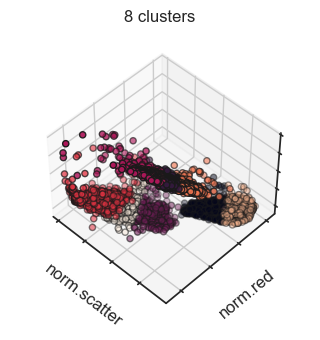

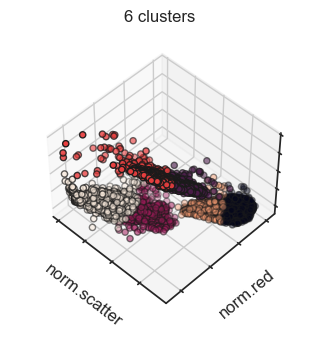

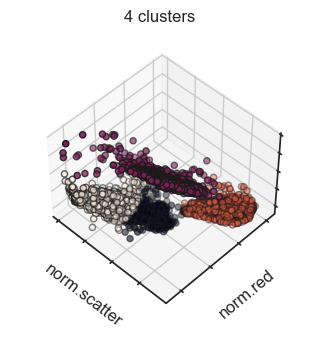

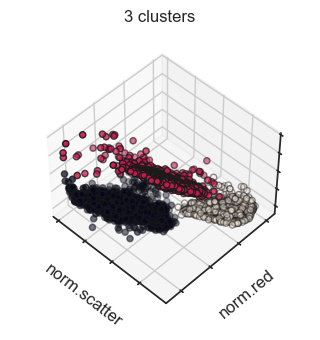

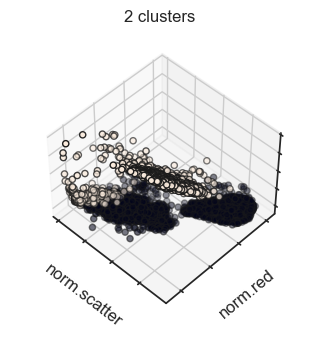

In [140]:
# explore different pipeline


estimators = [
    ("k_means_cyto_8", KMeans(n_clusters=8)),
    ("k_means_cyto_6", KMeans(n_clusters=6)),
    ("k_means_cyto_4", KMeans(n_clusters=4)),
    ("k_means_cyto_3", KMeans(n_clusters=3)),
    ("k_means_cyto_2", KMeans(n_clusters=2))]


fignum = 1
titles = ["8 clusters", "6 clusters", "4 clusters","3 clusters", "2 clusters"]
for name, est in estimators:
    fig = plt.figure(fignum, figsize=(4, 3))
    ax = fig.add_subplot(111, projection="3d", elev=48, azim=134)
    ax.set_position([0, 0, 0.95, 1])
    est.fit(X)
    labels = est.labels_

    ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=labels.astype(float), edgecolor="k")

    ax.w_xaxis.set_ticklabels([])
    ax.w_yaxis.set_ticklabels([])
    ax.w_zaxis.set_ticklabels([])
    ax.set_xlabel("norm.scatter")
    ax.set_ylabel("norm.red")
    ax.set_zlabel("norm.orange")
    ax.set_title(titles[fignum - 1])
    ax.dist = 12
    fignum = fignum + 1

# # Plot the ground truth
# fig = plt.figure(fignum, figsize=(4, 3))
# ax = fig.add_subplot(111, projection="3d", elev=48, azim=134)
# ax.set_position([0, 0, 0.95, 1])

# for name, label in [("Setosa", 0), ("Versicolour", 1), ("Virginica", 2)]:
#     ax.text3D(
#         X[y == label, 3].mean(),
#         X[y == label, 0].mean(),
#         X[y == label, 2].mean() + 2,
#         name,
#         horizontalalignment="center",
#         bbox=dict(alpha=0.2, edgecolor="w", facecolor="w"),
#     )
# # Reorder the labels to have colors matching the cluster results
# y = np.choose(y, [1, 2, 0]).astype(float)
# ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=y, edgecolor="k")

# ax.w_xaxis.set_ticklabels([])
# ax.w_yaxis.set_ticklabels([])
# ax.w_zaxis.set_ticklabels([])
# ax.set_xlabel("norm.scatter")
# ax.set_ylabel("norm.red")
# ax.set_zlabel("norm.orange")
# ax.set_title("Cyto Data cluster")
# ax.dist = 12

# fig.show()


# name,est=estimators[0]
# est.fit(X)
# labels = est.labels_

# fig = plt.figure(0, figsize=(4, 3))
# ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=labels.astype(float), edgecolor="k")
# ax.w_xaxis.set_ticklabels([])
# ax.w_yaxis.set_ticklabels([])
# ax.w_zaxis.set_ticklabels([])
# ax.set_xlabel("norm.scatter")
# ax.set_ylabel("norm.red")
# ax.set_zlabel("norm.orange")
# fig.show()

## 3.1.2 Choice of number of clusters: The Elbow Method

The elbow method is designed to find the optimal number of clusters. It consists in performing the clustering algorithm with an increasing number of clusters $k$ and select and measuring the average distance between data points and the cluster centroids. There are two typical metrics in the Elbow method

* **Distortion**: It is calculated as the average of the squared distances from the cluster centers of the respective clusters. Typically, the Euclidean distance metric is used.
* **Inertia**: It is the sum of squared distances of samples to their closest cluster center.

For each value of $k$, we compute the mean of the square of the distance between the data points and the centroid of the cluster to which they belong. We then plot this value as a function of $k$. Hopefully, it decreases and then reaches a plateau. The optimal number of clusters is the value for which it attains the minimum.

Let us use a different dataset to illustrate the elbow method.

Text(0.5, 1.0, 'Old Faithful')

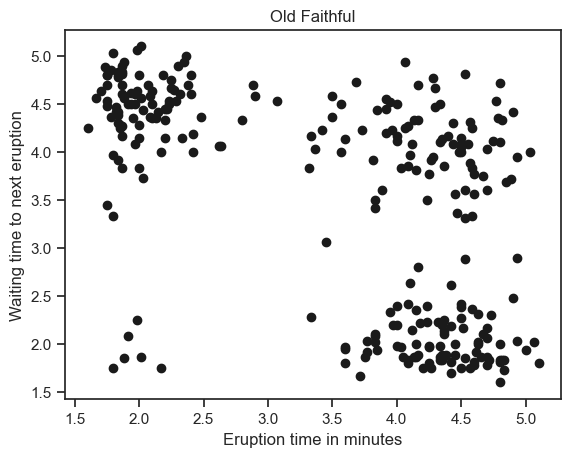

In [141]:
faithful = pd.read_csv('faithful.csv')
plt.plot(faithful.current, faithful.next, 'ko')
plt.xlabel('Eruption time in minutes')
plt.ylabel('Waiting time to next eruption')
plt.title('Old Faithful')

In [142]:
data_faithful = faithful.to_numpy()

In [143]:
def compute_elbow(data, clusters, centers, k):
    """
    """
    E = 0
    for i in range(0, k):
        distance = compute_distance(data[clusters == i, :], centers[i, :].reshape(1, -1), 1)
        E = E + np.mean(np.square(distance))
    return E

Compute the value of E for different values of the number of clusters

In [144]:
E = np.zeros(8)
for k in range(1, 9):
    (clusters, objective, centers) = my_kmeans(data_faithful, k)
    E[k - 1] = compute_elbow(data_faithful, clusters, centers, k)

Plot $E$ as a function of $k$ and see where reaches a minimum.

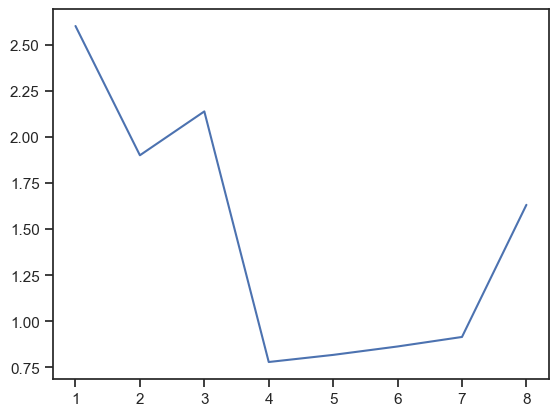

In [145]:
plt.plot(np.arange(1, 9), E)

The elbow method does not always work very well. For example, see what happens when the points get closer to each other.

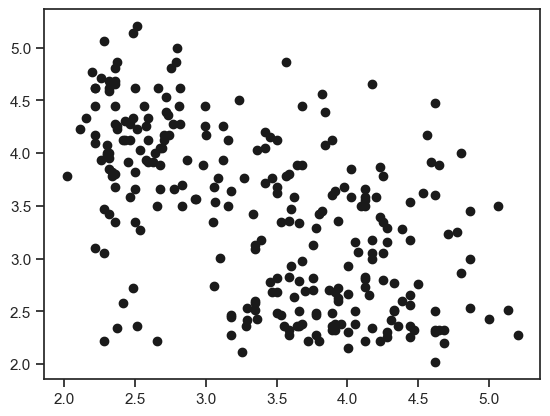

In [146]:
alpha = 0.5
origin = np.array([3, 3])
data_shrink = origin + alpha * np.sign(data_faithful - origin) * np.power(np.abs(data_faithful - origin), 2.0)
plt.plot(data_shrink[:, 0], data_shrink[:, 1], 'ko')

In [147]:
E = np.zeros(8)
for k in range(1, 9):
    (clusters, objective, centers) = my_kmeans(data_shrink, k)
    E[k - 1] = compute_elbow(data_shrink, clusters, centers, k)

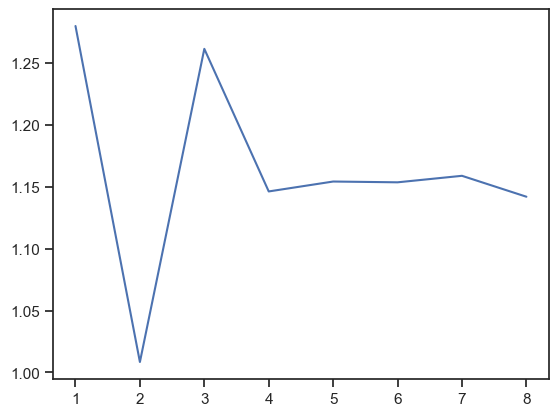

In [148]:
plt.plot(np.arange(1, 9), E)

Let us see what happens when we decrease the number of data

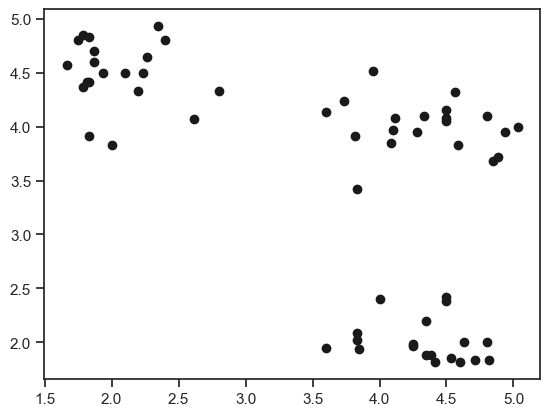

In [149]:
alpha = 0.2
indices = np.random.uniform(size=np.shape(data_faithful)[0])
subdata = data_faithful[indices < alpha, :]
plt.plot(subdata[:, 0], subdata[:, 1], 'ko')

In [151]:
E = np.zeros(8)
for k in range(1, 9):
    (clusters, objective, centers) = my_kmeans(subdata, k)
    E[k - 1] = compute_elbow(subdata, clusters, centers, k)

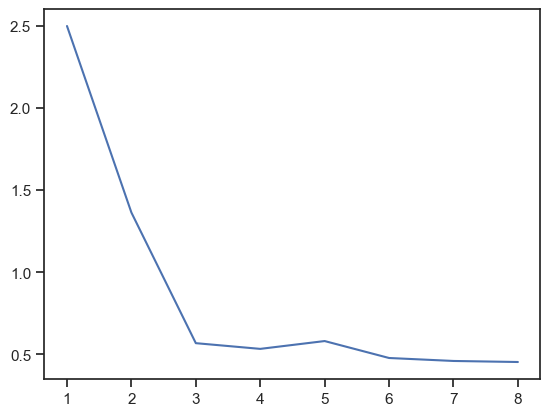

In [152]:
plt.plot(np.arange(1, 9), E)

## 3.2 Optimal Choice of Clusters

## 3.1.2 Reducing the dimensions before clustering: PCA

Let us generate synthetics data.

(-6.0, 3.0)

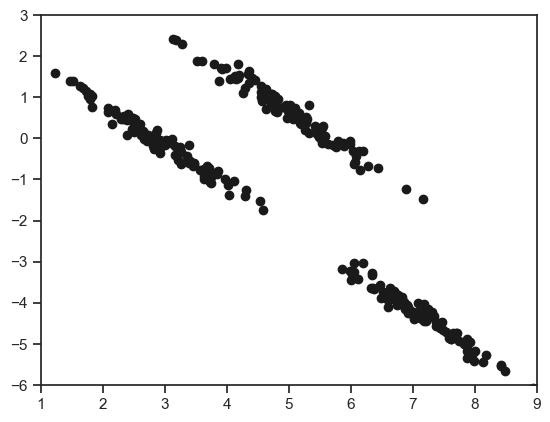

In [ ]:
centers = np.array([[2, 2], [2, 8], [4, 3]])
radius = [0.1, 1]
synthetics = np.empty([0, 2])
for i in range(0, 3):
    X = centers[i, 0] + radius[0] * np.random.randn(100)
    Y = centers[i, 1] + radius[1] * np.random.randn(100)
    U = (X + Y) * sqrt(2) / 2
    V = (X - Y) * sqrt(2) / 2
    synthetics = np.concatenate([synthetics, np.vstack((U, V)).T])
plt.plot(synthetics[:,0], synthetics[:,1], 'ko')
plt.xlim(1, 9)
plt.ylim(-6, 3)

Let us now do k-means clustering with 3 clusters.

In [ ]:
random.seed(0)
(clusters, objective, centers) = kmeans(synthetics, 3)
plt.scatter(synthetics[:,0], synthetics[:,1], c=clusters)

TypeError: 'KMeans' object is not callable

What happens if we apply PCA + normalization before the clustering?

In [ ]:
pca = PCA(n_components=2)
synthetics_pca = pca.fit_transform(synthetics)

In [ ]:
scaler = preprocessing.StandardScaler().fit(synthetics_pca)
synthetics_scaled = scaler.transform(synthetics_pca)

In [ ]:
(clusters, objective, centers) = kmeans(synthetics_scaled, 3)
plt.scatter(synthetics[:,0], synthetics[:,1], c=clusters)

## 3.3 Gaussian Mixture Models

## 3.3 Hierarchical clustering